In [1]:
%load_ext autoreload
%autoreload 2

In [17]:
# %load_ext autoreload
# %autoreload 2

import os
import torch
from skimage import io, measure
import numpy as np
import matplotlib.pyplot as plt

from tifffile import imread, imsave

import warnings
warnings.filterwarnings('ignore')

from tifffile import imread




if not torch.cuda.is_available():
    raise ValueError("GPU not found, code will run on CPU and can be extremely slow!")
else:
    device = torch.device("cuda:0")

import time
from glob import glob
import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint, EarlyStopping
import torch.optim as optim
import torch.utils.data as dt


import os
os.chdir('/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap')
from GAP_UNET_ResBlock_ffhq_super_res import UN
from BinomDataset_ffhq_super_res import BinomDataset
from DataFolderFFHQ import DataFolder
from inferencev3 import sample_image
from tasks import inpainting
from utils import preprocess, stack_video, stats

(-0.5, 511.5, 511.5, -0.5)

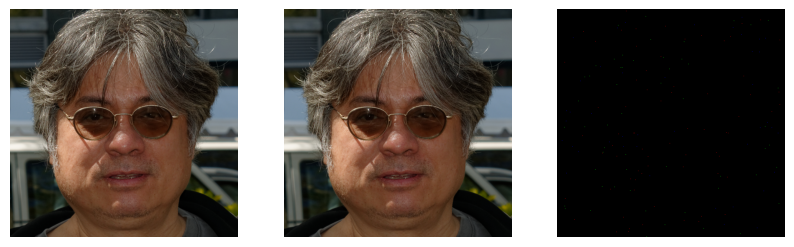

In [29]:
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/'
dataset = DataFolder(ffhq_path, minPSNR = -40, maxPSNR= 20, virtSize= 1)
dataTestGT, dataTestTarget, dataTest = dataset[491]
plt.figure(figsize= (10, 10))
vmax = np.percentile(dataTestGT, 99.9)
plt.subplot(1, 3, 1)
plt.imshow(preprocess(dataTestGT), vmin = 0, vmax = vmax)
plt.axis('off')
vmax = np.percentile(dataTestTarget, 99.9)
plt.subplot(1, 3, 2)
plt.imshow(preprocess(dataTestTarget), vmin = 0, vmax = vmax, cmap= 'gray')
plt.axis('off')
vmax = np.percentile(dataTest, 99.9)
plt.subplot(1, 3, 3)
plt.imshow(preprocess(dataTest), vmin = 0, vmax = vmax)
plt.axis('off')

#### Downsampling Strategy
- Bicubic interpolation with anti aliasing

In [4]:
# stats(dataTestGT, dataTestTarget, dataTest)

In [5]:
from torchvision.transforms.functional import resize, center_crop
from PIL import Image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


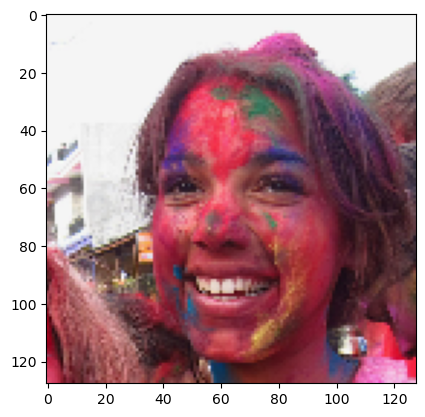

In [6]:
img = torch.nn.functional.interpolate(input= dataTestGT[None],
                                      size= (128, 128),
                                      mode= 'bicubic',
                                      antialias= False)
plt.imshow(preprocess(img[0]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


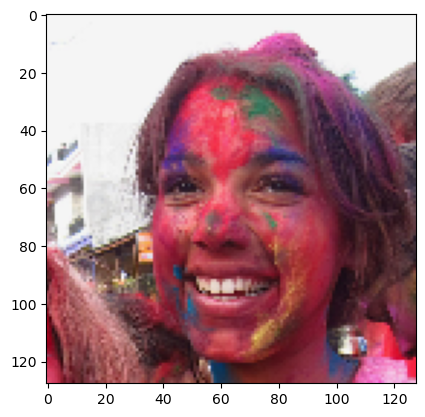

In [7]:
img = resize(dataTestGT[None], 128, Image.BICUBIC, antialias= False)
plt.imshow(preprocess(img[0]))

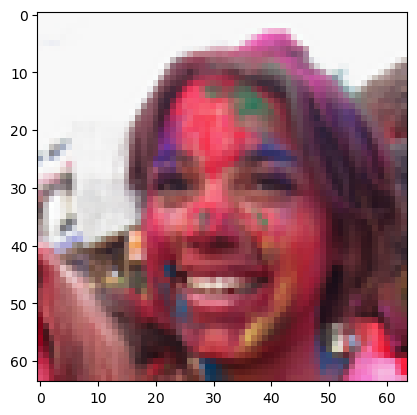

In [8]:
from torchvision.transforms.functional import resize, center_crop

size = 64
img = resize(dataTestGT[None], size, Image.BICUBIC, antialias= True)
img = center_crop(img, size)

plt.imshow(preprocess(img[0]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


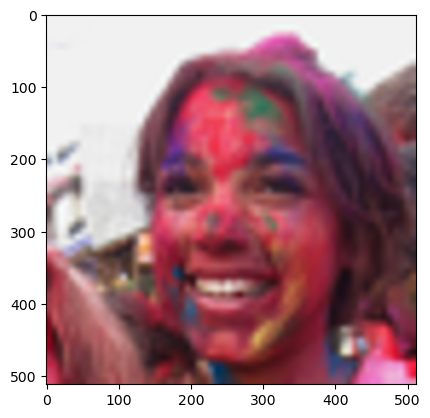

In [9]:
size = 512
img = resize(img, size, Image.BICUBIC, antialias= True)
img = center_crop(img, size)
plt.imshow(preprocess(img[0]))

In [10]:
img.shape

torch.Size([1, 3, 512, 512])

In [11]:
from BinomDataset_ffhq_super_res import BinomDataset

In [12]:
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = -40
maxpsnr = 30
dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, augment= False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 511.5, 511.5, -0.5)

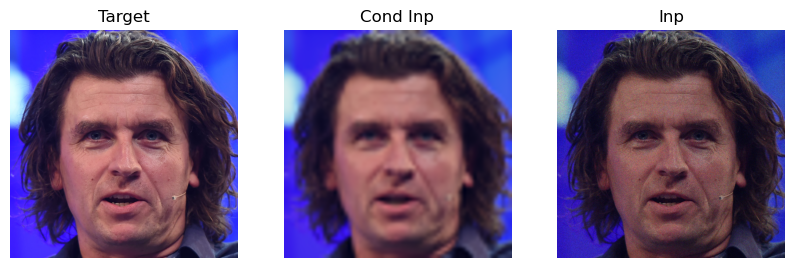

In [24]:
channels = 3
img = dataset[5000000000]
plt.figure(figsize= (10, 10))
plt.subplot(1, 3, 1)
plt.imshow(preprocess(img[:channels]))
plt.title('Target')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(preprocess(img[channels:channels + channels]))
plt.title('Cond Inp')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(preprocess(img[channels + channels:channels  + channels + channels]), vmin = 0, vmax = 255)
plt.title('Inp')
plt.axis('off')

In [111]:
stats(img[:channels], img[channels:channels + channels], img[channels + channels:channels  + channels + channels])


Shape : torch.Size([3, 512, 512])

Min : 0.0

Max : 3.1781067848205566

Sum : 786432.0625

Mean : 1.0000001192092896


Shape : torch.Size([3, 512, 512])

Min : -0.06115836650133133

Max : 3.0663650035858154

Sum : 786432.0625

Mean : 1.0000001192092896


Shape : torch.Size([3, 512, 512])

Min : 0.0

Max : 150.0

Sum : 31144164.0

Mean : 39.60185241699219



In [18]:
name = 'm40to30-256x256-ffhq-super-res'
# name = 'm40to30-256x256-ffhq-run-2'
CHECKPOINT_PATH = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/checkpoints/models/'

model = UN(channels = 3, levels=10, depth=6,start_filts=32, 
           up_mode = 'upsample', merge_mode = 'concat').to(device)
model = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

In [79]:
from torchvision import transforms
def convert2lowres(img):
    lr = transforms.functional.resize(img = img, size = 64, interpolation = Image.BICUBIC, antialias = True)
    lr = transforms.functional.center_crop(img  = lr, output_size = 64)
    sr = transforms.functional.resize(img = lr, size = 512, interpolation = Image.BICUBIC, antialias = True)
    return sr

(-0.5, 511.5, 511.5, -0.5)

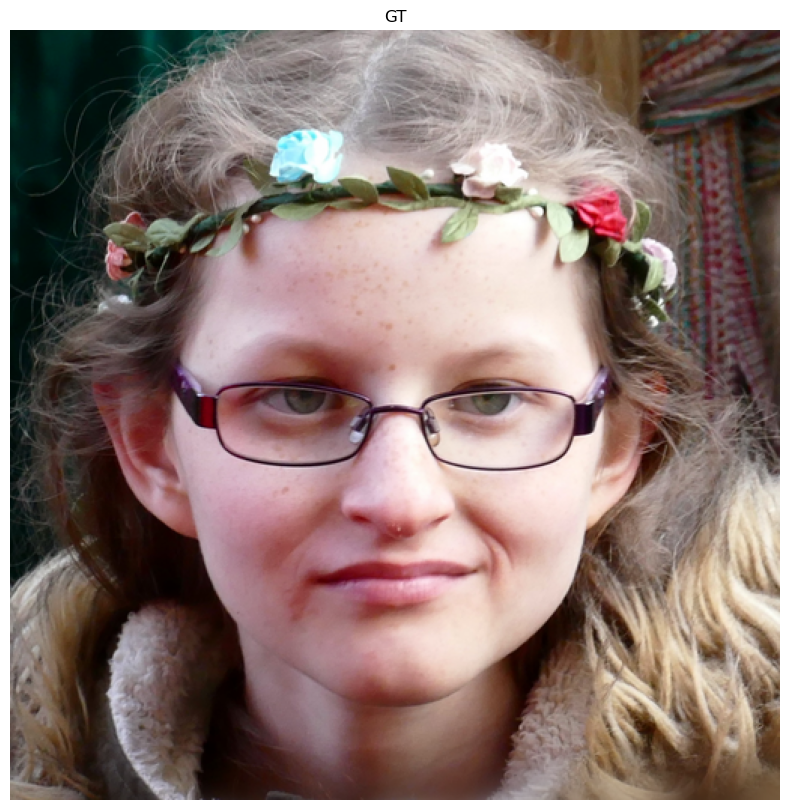

In [140]:
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/'
dataset = DataFolder(ffhq_path, minPSNR = -20, maxPSNR= 0)
dataTestGT, dataTestTarget, dataTest = dataset[422]
plt.figure(figsize= (10, 10))
vmax = np.percentile(dataTestGT, 99.9)
# plt.subplot(1, 3, 1)
# plt.imshow(preprocess(dataTestGT), vmin = 0, vmax = vmax)
# plt.axis('off')
vmax = np.percentile(dataTestTarget, 99.9)
# plt.subplot(1, 3, 2)
plt.imshow(preprocess(dataTestTarget), vmin = 0, vmax = vmax)
plt.title('GT')
plt.axis('off')
# vmax = np.percentile(dataTest, 99.9)
# plt.subplot(1, 3, 3)
# plt.imshow(preprocess(dataTest), vmin = 0, vmax = vmax)
# plt.axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 511.5, 511.5, -0.5)

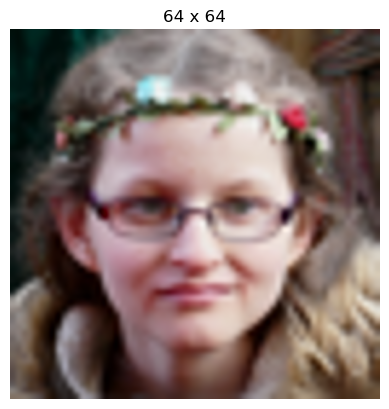

In [141]:
cond_inp = convert2lowres(dataTestGT)
cond_inp = cond_inp/(cond_inp.mean()+ 1e-8)
plt.imshow(preprocess(cond_inp))
plt.title('64 x 64')
plt.axis('off')

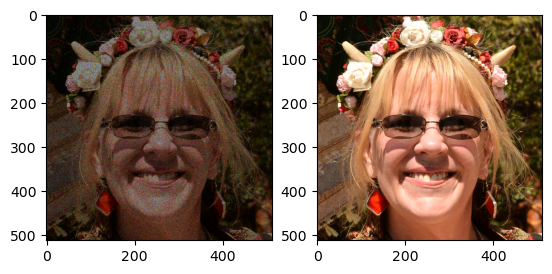

In [106]:
from PSNRSample import PSNRSample
psnr = PSNRSample(minPSNR= -40, maxPSNR= 30)
dataTest = psnr.sample(dataTestGT, 0.7)
testGT = dataTestGT/dataTestGT.mean()
cond_test = testGT 
plt.subplot(1, 2, 1)
plt.imshow(preprocess(dataTest))
plt.subplot(1, 2, 2)
plt.imshow(preprocess(cond_test))

torch.Size([3, 512, 512])
torch.Size([1, 3, 512, 512])
torch.Size([3, 512, 512])
input shape : torch.Size([1, 6, 512, 512]), model input shape : torch.Size([1, 1, 6, 512, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(255.) tensor(0.) tensor(72.9331) 255.0 90.0
inp shape : torch.Size([3, 512, 512])
out shape : torch.Size([1, 3, 512, 512])
gt shape : torch.Size([3, 512, 512])


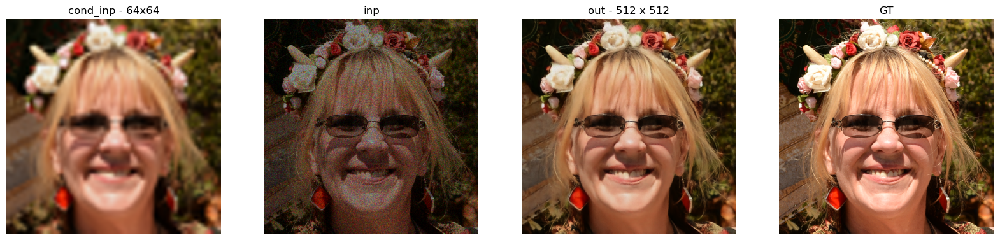

In [107]:
cond_input = cond_inp[None]
# cond_input = torch.from_numpy(np.zeros_like(cond_input))
for inp, cinp, gt in zip(dataTest[None], cond_input[None], dataTestGT[None]): 
    print(inp.shape) 
    print(cinp.shape) 
    print(gt.shape) 

    inpT = inp.to(device) 
    cond_inpT = cinp.to(device)
    inpT = torch.cat([cond_inpT, inpT[None]], dim = 1).to(device)
    print(f'input shape : {inpT.shape}, model input shape : {inpT[None].shape}')
    out = torch.exp(model(inpT).detach().cpu())
    out = inp.sum() * out / out.sum() 
    
    print(gt.max(), gt.min(), gt.std(), np.percentile(gt,99.9), np.percentile(gt,50))

    inp = inp/inp.mean()
    out = out/out.mean()
    gt = gt/gt.mean()
    # cond_inp = cinp[1]/cinp[1].mean()

    
    print(f'inp shape : {inp.shape}')
    print(f'out shape : {out.shape}')
    print(f'gt shape : {gt.shape}')

    cond_vmax = np.percentile(preprocess(cond_input[0]),99.9)
    plt.figure(figsize=(20,20))
    plt.subplot(1, 4, 1)
    plt.imshow(preprocess(cond_input[0]) ,vmin = 0, vmax = cond_vmax, cmap = 'gray')
    plt.title('cond_inp - 64x64')
    plt.axis('off')

    vmax = np.percentile(preprocess(gt),99.9)
    plt.subplot(1, 4, 2)
    plt.imshow(preprocess(inp),vmin = 0, vmax = vmax)
    plt.title('inp')
    # plt.show()
    plt.axis('off')
    vmax = np.percentile(preprocess(gt),99.9)
    plt.subplot(1, 4, 3)
    plt.imshow(preprocess(out[0]),vmin = 0,vmax = vmax)
    plt.title('out - 512 x 512')
    # plt.show()
    plt.axis('off')
    
    plt.subplot(1, 4, 4)
    plt.imshow(preprocess(gt),vmin = 0,vmax = vmax)
    plt.title('GT')
    plt.axis('off')
    plt.show()
    


cond_input shape torch.Size([1, 3, 512, 512])
cond_img shape torch.Size([1, 3, 512, 512])
input_img shape torch.Size([1, 6, 512, 512])
input_img shape torch.float32
(1, 3, 512, 512)


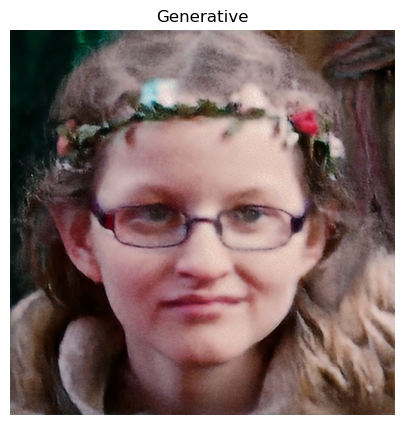

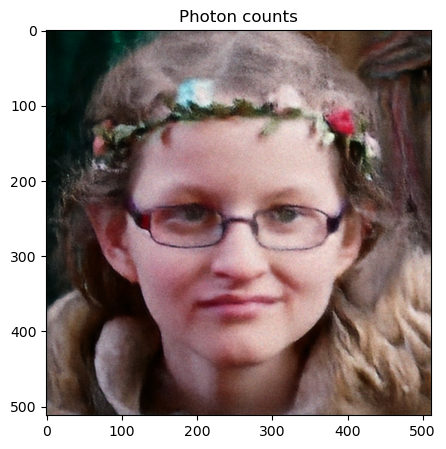

_______________________________________ 2301
time (s): 117.32755398750305 time per image (s) 117.32755398750305


In [155]:
import matplotlib.image as mpimg
import time
import numpy as np
from inference_ffhq import sample_image

# We are starting with an image containing zeros,
# i.e., sampling from scratch

# we just have 1 channel
channels = 3
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 512
pixels_y = 512

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x)
# inp_img = test.permute(2, 0, 1)[None]
# masks2 = inpainting(imgsize = 512, masksize = 500)
# mask = masks2.generate_mask().numpy()
cond_input = cond_inp[None]
print(f'cond_input shape {cond_input.shape}')
inp_img = dataTest[None]
cond_img = cond_input
print(f'cond_img shape {cond_img.shape}')

# cond_img = torch.zeros_like(cond_img)
input_img = torch.cat((cond_img, inp_img), 1).to(device)
print(f'input_img shape {input_img.shape}')
print(f'input_img shape {input_img.dtype}')


for i in range(1):

    startTime = time.time()
    
    # sampling the image(s)
    denoised, photons, stack, iterations = sample_image(input_img,
                                                        model, 
                                                        beta = 0.005,
                                                        save_every_n = 10,
                                                        max_psnr = 30,
                                                        max_its = 20000000,
                                                        channels = 3)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):
#         print(iterations)
            # print(denoised.shape)
            # plt.figure(figsize = (5,5))
            # plt.imshow(denoised[j].transpose(1, 2, 0), cmap='inferno', vmin = 0,
            #            vmax = np.percentile(denoised[j],99.99))
            # plt.title('Generative')
            # plt.axis('off')
            # plt.show()
            
            # plt.figure(figsize = (5,5))
            # plt.imshow(photons[j,0], cmap='inferno', vmin = 0,
            #            vmax = np.percentile(photons[j],99.99))
            # plt.title('Photon counts')
            # plt.show()
            denoised/=denoised.mean()
            print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(denoised[0]), vmin = 0,
                       vmax = np.percentile(denoised[0],99.99))
            plt.title('Generative')
            plt.axis('off')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(photons[0]), vmin = 0,
                       vmax = np.percentile(photons[j],99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    
    
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print ('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])
   

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 511.5, 511.5, -0.5)

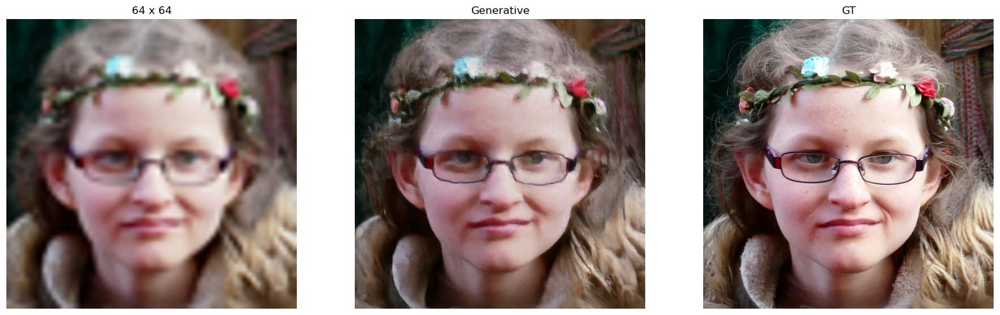

In [143]:
plt.figure(figsize = (20, 20))
plt.subplot(1, 3, 1)
plt.imshow(preprocess(cond_inp))
plt.title('64 x 64')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(preprocess(denoised[0]), vmin = 0,
            vmax = np.percentile(denoised[0],99.99))
plt.title('Generative')
plt.axis('off')
plt.subplot(1, 3, 3)
vmax = np.percentile(dataTestTarget, 99.9)
# plt.subplot(1, 3, 2)
plt.imshow(preprocess(dataTestTarget), vmin = 0, vmax = vmax)
plt.title('GT')
plt.axis('off')

0


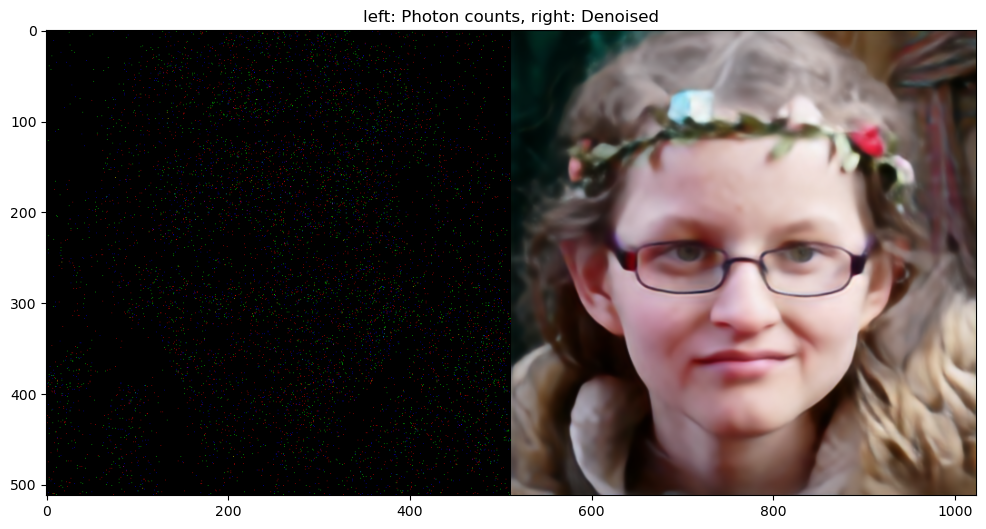

50


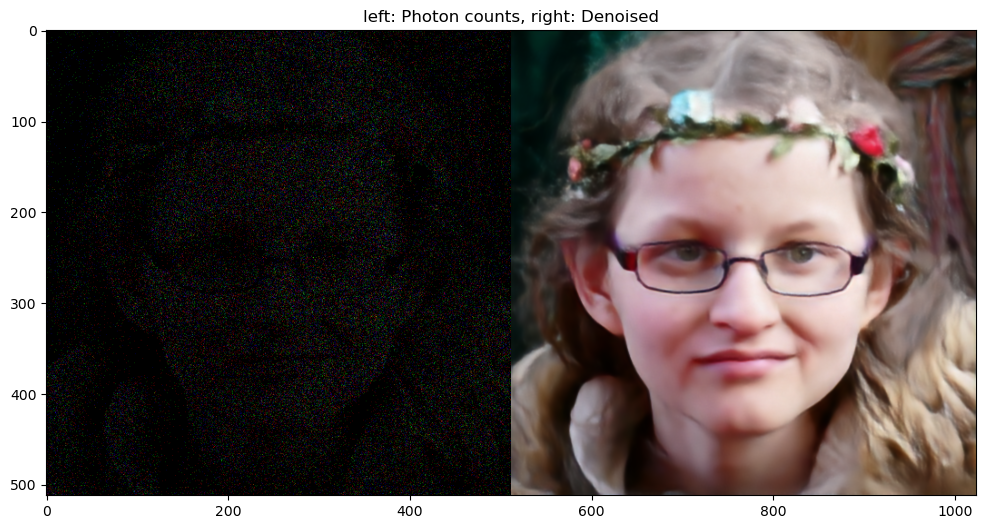

100


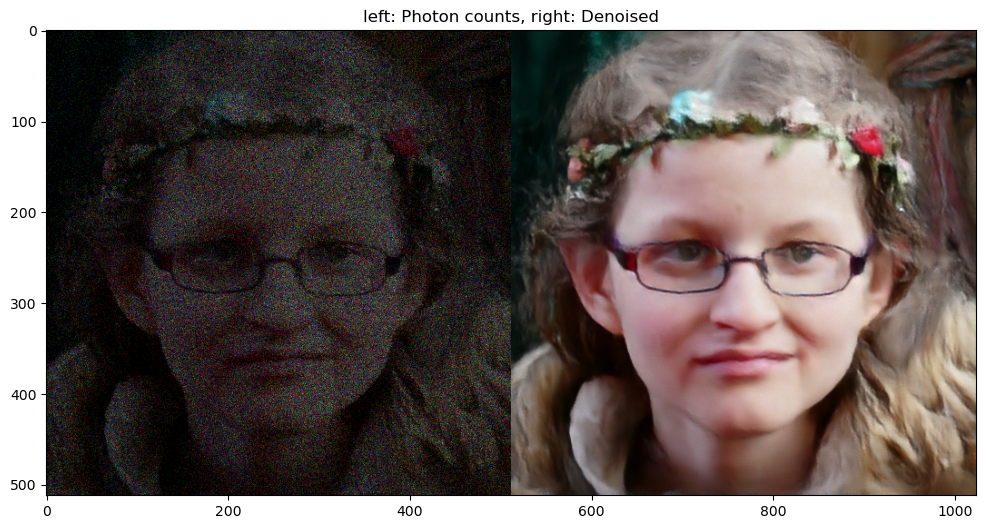

150


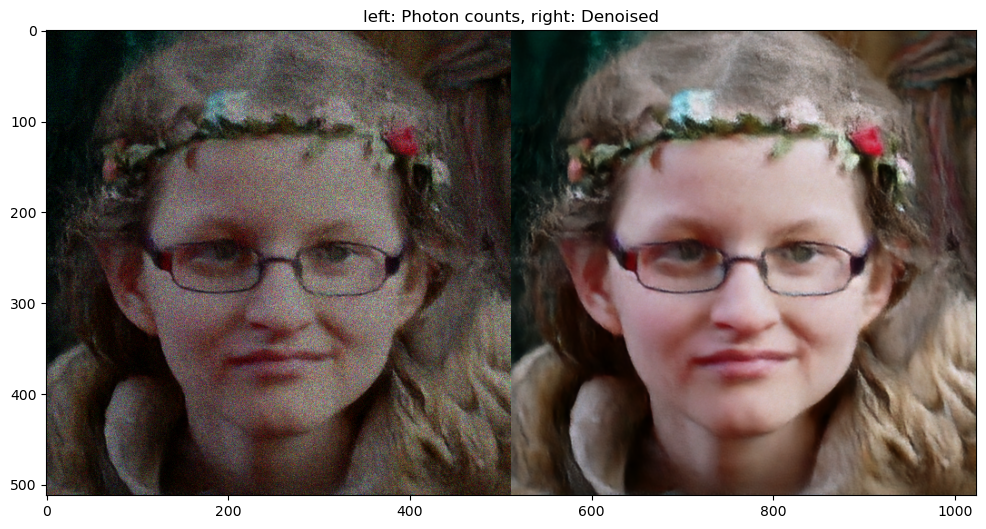

200


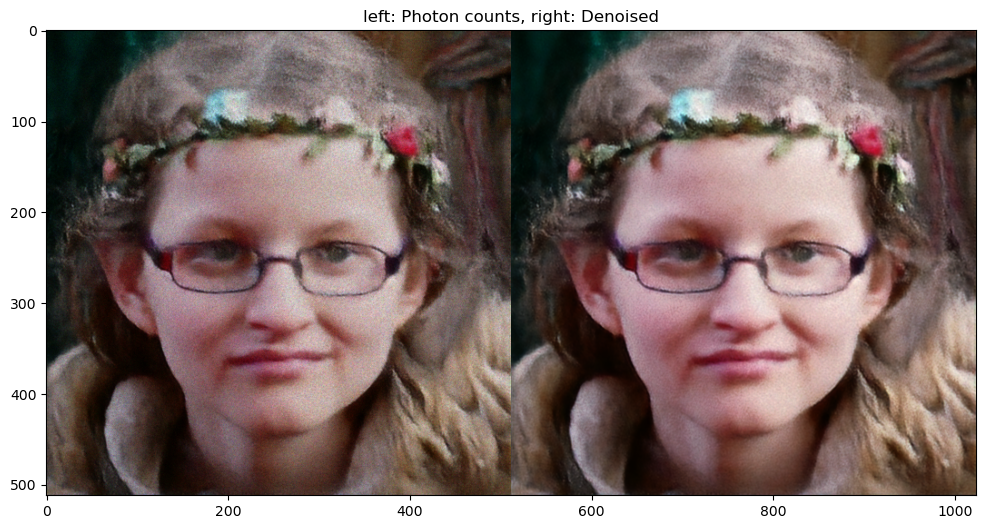

In [157]:
stack[0].shape
for i in range(len(stack)):
    if i%50 == 0:
        im = stack[i]
        print(i)
        plt.figure(figsize = (12,12))
        plt.imshow(preprocess(im),cmap ='inferno', vmax = 0.9)
        plt.title('left: Photon counts, right: Denoised')
        plt.show()

In [ ]:
file_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/stack-videos/'
file_name = 'conv-inpainting-generative-2.mp4'
stack_video(stack= stack, 
            filename= os.path.join(file_path, file_name))